In [2]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from numba import jit, njit
from tqdm.notebook import tqdm
### ANIMATAION 관련 ###
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib
from matplotlib.colors import Normalize
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [73]:
N = 39
G = nx.grid_graph(dim=(N,N))

In [74]:
A = nx.adjacency_matrix(G)
M = A.sum(axis=1)
Aij = A.todense()
Dij = Aij - M*np.eye(N**2)
omega_ij = np.zeros((N,N))

In [6]:
# @jit(nopython = True)
@njit
def Kuramoto_WAVE(Theta,t,omega,N,K,Dij):
    # print("Case m = 0")
    Theta = Theta.copy()
    theta = Theta[:N]
    dtheta = omega +  K*np.sin(np.sum(Dij*theta,axis=1))
    Theta[:N] = dtheta
    return Theta

@njit
def RK4(f, y0, t, args=()):
    n = len(t)
    y = np.zeros((n, len(y0)))
    y[0] = y0

    for i in range(n - 1):
        h = t[i + 1] - t[i]
        k1 = f(y[i], t[i], *args)
        k2 = f(y[i] + k1 * h / 2.0, t[i] + h / 2.0, *args)
        k3 = f(y[i] + k2 * h / 2.0, t[i] + h / 2.0, *args)
        k4 = f(y[i] + k3 * h, t[i] + h, *args)
        y[i + 1] = y[i] + (h / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)
    return y

In [76]:
omega_ij = np.zeros((N,N))
speed = 3
omega_ij[(N)//2,(N)//2] = speed
omega_ij[(N)//2,0] = speed
omega_ij[(N)//2,N-1] = speed
omega_ij[0,(N)//2] = speed
omega_ij[-1,(N)//2] = speed
omega_ij[0,0] = speed
omega_ij[0,-1] = speed
omega_ij[-1,-1] = speed
omega_ij[-1,0] = speed


In [77]:
omega_ij = np.zeros((N,N))

# omega_ij +=3*np.eye(N) * np.linspace(-1,1,N)
omega_ij[:,0] = 0.5
omega_ij[:,-1] = 0.5
omega_ij[0,:] = 0.5
omega_ij[-1,:] = 0.5


In [78]:
omega_ij = np.zeros((N,N))
omega_ij[(N)//2,(N)//2] = 1



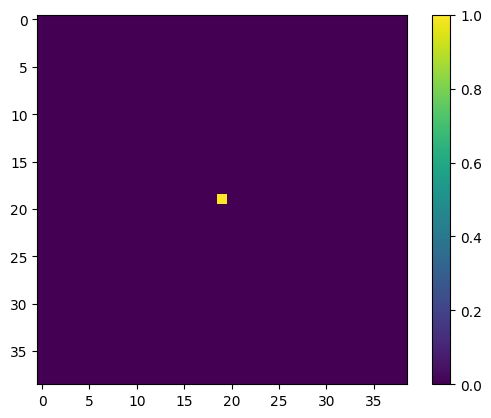

In [79]:
plt.imshow(omega_ij)
plt.colorbar()

In [12]:
omega_ij.flatten().shape

(2401,)

In [13]:
N**2

2401

In [87]:
dt = 0.01
t_end = 300
t = np.arange(0, t_end+dt/2, dt)
theta_init = np.zeros(N**2)
# theta_init = sol[-1]
omega = omega_ij.flatten()
sol = RK4(Kuramoto_WAVE,theta_init,t, args=(omega,N**2,10,Dij))

In [90]:
sol = (sol + np.pi)%(2*np.pi)-np.pi

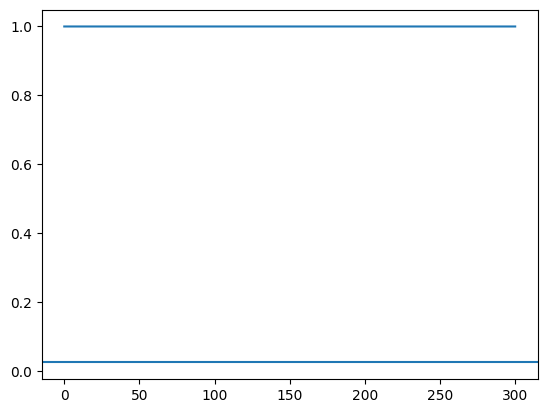

In [91]:
r = np.mean(np.exp(1j*sol),axis=1)

plt.plot(t,abs(r))
plt.axhline(1/np.sqrt(N**2))

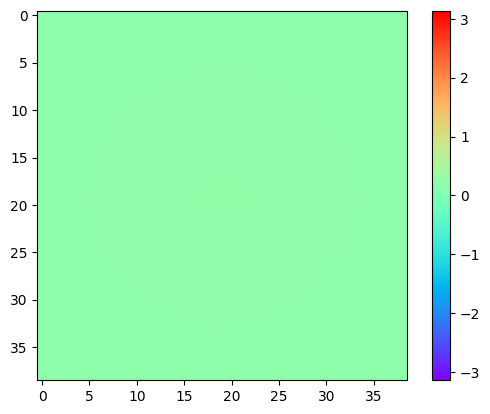

In [92]:
idx = -10
fig_pi,ax = plt.subplots(1,1)
data = sol[idx].reshape((N,N))
XX,YY =  np.meshgrid(np.arange(N),np.arange(N))
# im = ax.imshow(np.sin(data),vmin=-1,vmax=1,cmap='hsv',origin='lower')
normpi = Normalize(vmin=-np.pi,vmax=np.pi)
im = ax.imshow(data,norm=normpi,cmap='rainbow')
fig_pi.colorbar(im)

In [95]:
def animation(idx):
    # data_n = np.sin(sol[idx].reshape((N,N)))
    data_n = sol[idx].reshape((N,N))
    im.set_data(data_n)
idxs=  np.arange(0,5000,10)

In [96]:
ani = FuncAnimation(fig_pi,animation,frames=idxs,interval=50)
# 확인용
HTML(ani.to_html5_video())

In [645]:
A = nx.adjacency_matrix(G)
M = A.sum(axis=1)
Aij = A.todense()
LO = Aij.copy()

for i in range(N**2):
    nearset = np.array([i+1,i-1,i+N,i-N,i+(N+1),i-(N+1),i+(N-1),i-(N-1)])
    where, = np.where((nearset>=0)&(nearset<N**2))
    LO[i,nearset[where]] = 1
M_LO = np.sum(LO,axis=1)

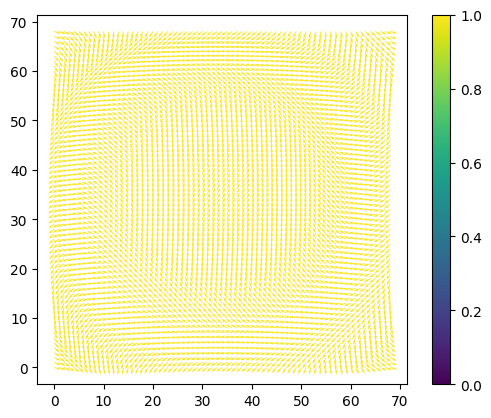

In [646]:
fig,ax_flow = plt.subplots(1,1)
idx = -1
X,Y = np.meshgrid(np.arange(N),np.arange(N))
data = sol[idx].reshape((N,N))
U = np.cos(data)
V = np.sin(data)
NORMZ = Normalize(vmin=0., vmax=1)
R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
R = np.abs(R_THETA).reshape(N,N)

Q = ax_flow.quiver(X,Y,U,V,R,scale=50,norm=NORMZ)
fig.colorbar(Q)
ax_flow.set_aspect('equal')

In [613]:
def animation_flow(idx):
    ax_flow.clear()
    data = sol[idx].reshape((N,N))
    U = np.cos(data)
    V = np.sin(data)

    R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
    R = np.abs(R_THETA).reshape(N,N)


    Q = ax_flow.quiver(X,Y,U,V,R,scale=50,norm=NORMZ)
    ax_flow.set_aspect('equal')

In [614]:
idxs=  np.arange(0,len(sol),10)
# ani = FuncAnimation(fig,animation,frames=idxs,interval=50)
ani = FuncAnimation(fig,animation_flow,frames=idxs,interval=50)

In [615]:
# 확인용
HTML(ani.to_html5_video())

## R only

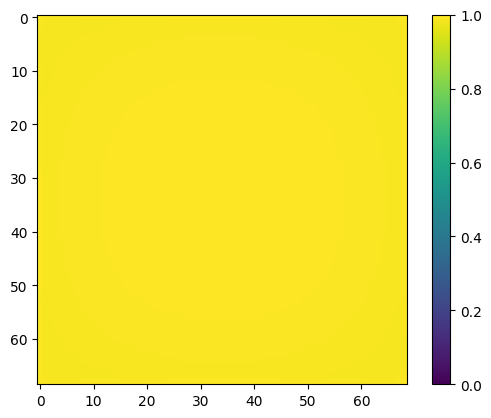

In [644]:
fig_r,ax_r = plt.subplots(1,1)
idx = -1
X,Y = np.meshgrid(np.arange(N),np.arange(N))
data = sol[idx].reshape((N,N))

NORMZ = Normalize(vmin=0., vmax=1)
R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
R = np.abs(R_THETA).reshape(N,N)
normr = Normalize(vmin=0,vmax=1)
R_c =ax_r.imshow(R,norm=normr)
fig_r.colorbar(R_c)
ax_r.set_aspect('equal')

In [617]:
def animation_r(idx):

    R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
    R = np.abs(R_THETA).reshape(N,N)

    R_c.set_data(R)


In [618]:
# idxs=  np.arange(0,5000,10)
# ani = FuncAnimation(fig,animation,frames=idxs,interval=50)
ani = FuncAnimation(fig_r,animation_r,frames=idxs,interval=50)

In [619]:
# 확인용
HTML(ani.to_html5_video())

In [335]:
from numba import jit,njit
import numpy as np
import time

x = np.arange(100).reshape(10, 10)

@jit(nopython=True)
def go_fast_jit(a): # Function is compiled and runs in machine code
    trace = 0.0
    for i in range(a.shape[0]):
        trace += np.tanh(a[i, i])
    return a + trace


def go_fast(a): # Function is compiled and runs in machine code
    trace = 0.0
    for i in range(a.shape[0]):
        trace += np.tanh(a[i, i])
    return a + trace


In [254]:
%timeit go_fast(x)

6.53 µs ± 151 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


In [255]:
%timeit go_fast_jit(x)

446 ns ± 14.4 ns per loop (mean ± std. dev. of 7 runs, 1,000,000 loops each)


In [250]:
from numba import jit
import numpy as np
import time

x = np.arange(100).reshape(10, 10)

@jit(nopython=True)
def go_fast(a): # Function is compiled and runs in machine code
    trace = 0.0
    for i in range(a.shape[0]):
        trace += np.tanh(a[i, i])
    return a + trace

# DO NOT REPORT THIS... COMPILATION TIME IS INCLUDED IN THE EXECUTION TIME!
start = time.time()
go_fast(x)
end = time.time()
print("Elapsed (with compilation) = %s" % (end - start))

# NOW THE FUNCTION IS COMPILED, RE-TIME IT EXECUTING FROM CACHE
start = time.time()
go_fast(x)
end = time.time()
print("Elapsed (after compilation) = %s" % (end - start))


Elapsed (with compilation) = 0.07110810279846191
Elapsed (after compilation) = 2.288818359375e-05


In [251]:
A = go_fast

In [252]:
%timeit A(x)

449 ns ± 6.45 ns per loop (mean ± std. dev. of 7 runs, 1,000,000 loops each)


In [115]:
A = nx.adjacency_matrix(G)
M = A.sum(axis=1)
Aij = A.todense()
LO = Aij.copy()

for i in range(N**2):
    nearset = np.array([i+1,i-1,i+N,i-N,i+(N+1),i-(N+1),i+(N-1),i-(N-1)])
    where, = np.where((nearset>=0)&(nearset<N**2))
    LO[i,nearset[where]] = 1
M_LO = np.sum(LO,axis=1)

In [123]:
idx =200
R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
R = np.abs(R_THETA).reshape(N,N)

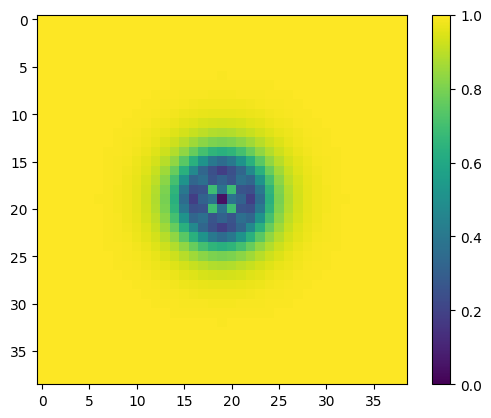

In [124]:
plt.imshow(R,vmin=0,vmax=1)
plt.colorbar()

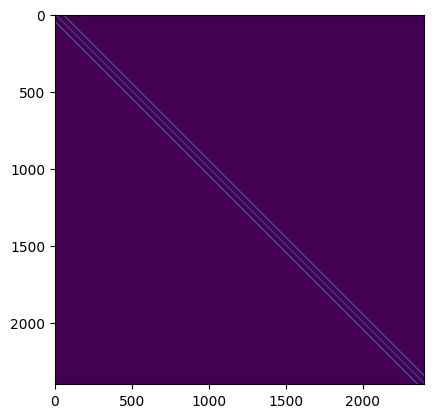

In [33]:
plt.imshow(LO)

## Change minimal model

In [4]:
N = 3
G = nx.grid_graph(dim=(N,N))
A = nx.adjacency_matrix(G)
M = A.sum(axis=1)
Aij = A.todense()
Dij = Aij - M*np.eye(N**2)
omega_ij = np.zeros((N,N))

In [5]:
omega_ij = np.zeros((N,N))
omega_c =3
omega_ij[(N)//2,(N)//2] = omega_c



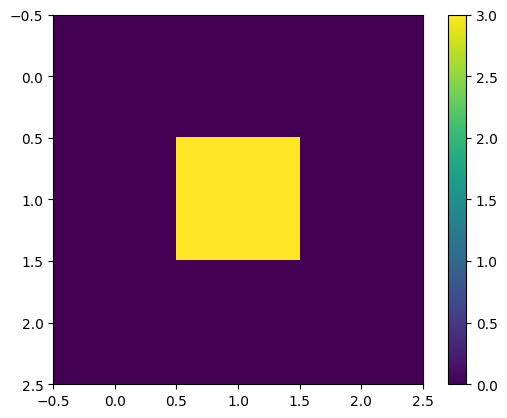

In [6]:
plt.imshow(omega_ij)
plt.colorbar()

In [7]:
omega_ij.flatten().shape

(9,)

In [8]:
N**2

9

In [9]:
dt = 0.01
t_end = 300
K = 10

t = np.arange(0, t_end+dt/2, dt)
theta_init = np.zeros(N**2)
# theta_init = sol[-1]
omega = omega_ij.flatten()
sol = RK4(Kuramoto_WAVE,theta_init,t, args=(omega,N**2,K,Dij))

In [10]:
sol = (sol + np.pi)%(2*np.pi)-np.pi


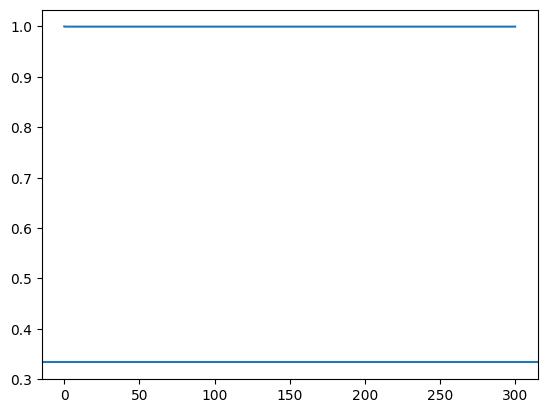

In [11]:
r = np.mean(np.exp(1j*sol),axis=1)

plt.plot(t,abs(r))
plt.axhline(1/np.sqrt(N**2))

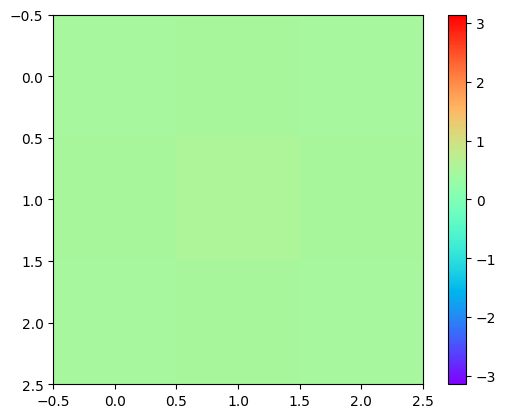

In [12]:
idx = -10
fig_pi,ax = plt.subplots(1,1)
data = sol[idx].reshape((N,N))
XX,YY =  np.meshgrid(np.arange(N),np.arange(N))
# im = ax.imshow(np.sin(data),vmin=-1,vmax=1,cmap='hsv',origin='lower')
normpi = Normalize(vmin=-np.pi,vmax=np.pi)
im = ax.imshow(data,norm=normpi,cmap='rainbow')
fig_pi.colorbar(im)

In [13]:
def animation(idx):
    # data_n = np.sin(sol[idx].reshape((N,N)))
    data_n = sol[idx].reshape((N,N))
    im.set_data(data_n)
idxs=  np.arange(0,1000,10)

In [14]:
ani = FuncAnimation(fig_pi,animation,frames=idxs,interval=50)
# 확인용
HTML(ani.to_html5_video())

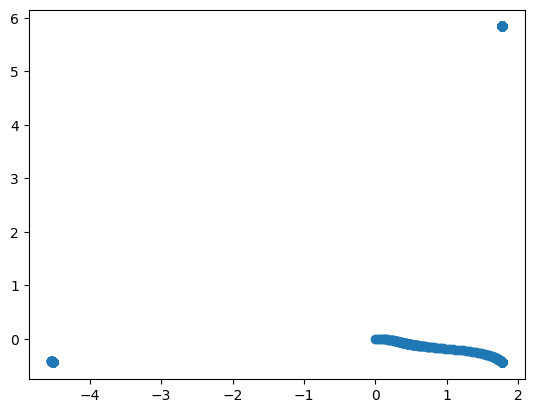

In [ ]:
theta_1 = sol[:,4]
theta_2 = sol[:,1]
theta_3 = sol[:,0]
plt.scatter(theta_1-theta_2,theta_3-theta_2)

In [68]:
A = nx.adjacency_matrix(G)
M = A.sum(axis=1)
Aij = A.todense()
LO = Aij.copy()

for i in range(N**2):
    nearset = np.array([i+1,i-1,i+N,i-N,i+(N+1),i-(N+1),i+(N-1),i-(N-1)])
    where, = np.where((nearset>=0)&(nearset<N**2))
    LO[i,nearset[where]] = 1
M_LO = np.sum(LO,axis=1)

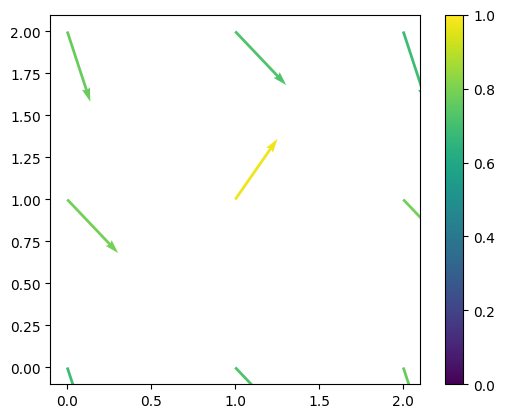

In [69]:
fig,ax_flow = plt.subplots(1,1)
idx = -1
X,Y = np.meshgrid(np.arange(N),np.arange(N))
data = sol[idx].reshape((N,N))
U = np.cos(data)
V = np.sin(data)
NORMZ = Normalize(vmin=0., vmax=1)
R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
R = np.abs(R_THETA).reshape(N,N)

Q = ax_flow.quiver(X,Y,U,V,R,scale=5,norm=NORMZ)
fig.colorbar(Q)
ax_flow.set_aspect('equal')

In [70]:
def animation_flow(idx):
    ax_flow.clear()
    data = sol[idx].reshape((N,N))
    U = np.cos(data)
    V = np.sin(data)

    R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
    R = np.abs(R_THETA).reshape(N,N)


    Q = ax_flow.quiver(X,Y,U,V,R,scale=5,norm=NORMZ)
    ax_flow.set_aspect('equal')

In [71]:
idxs=  np.arange(0,5000,50)
# ani = FuncAnimation(fig,animation,frames=idxs,interval=50)
ani = FuncAnimation(fig,animation_flow,frames=idxs,interval=50)

In [72]:
# 확인용
HTML(ani.to_html5_video())

## R only

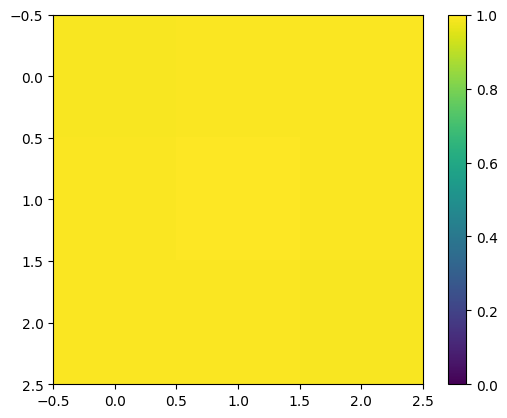

In [42]:
fig_r,ax_r = plt.subplots(1,1)
idx = -1
X,Y = np.meshgrid(np.arange(N),np.arange(N))
data = sol[idx].reshape((N,N))

NORMZ = Normalize(vmin=0., vmax=1)
R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
R = np.abs(R_THETA).reshape(N,N)
normr = Normalize(vmin=0,vmax=1)
R_c =ax_r.imshow(R,norm=normr)
fig_r.colorbar(R_c)
ax_r.set_aspect('equal')

In [ ]:
def animation_r(idx):

    R_THETA=np.sum(LO*np.exp(1j*sol[idx]) ,axis=1)/M_LO
    R = np.abs(R_THETA).reshape(N,N)

    R_c.set_data(R)


In [ ]:
# idxs=  np.arange(0,5000,10)
# ani = FuncAnimation(fig,animation,frames=idxs,interval=50)
ani = FuncAnimation(fig_r,animation_r,frames=idxs,interval=50)

In [ ]:
# 확인용
HTML(ani.to_html5_video())

In [3]:
@njit
def Kuramoto_Wmini(PHI,t,N,omega,K):
    # print("Case m = 0")
    PHI = PHI.copy()
    phi1 = PHI[:N]
    phi2 = PHI[N:]
    dphi1 = -omega + K*(np.sin(2*phi2-phi1)-np.sin(4*phi1))
    dphi2 = K*(-np.sin(phi2)-np.sin(2*phi2-phi1))
    PHI[:N] = dphi1
    PHI[N:] = dphi2
    return PHI

In [80]:
s = 10
# theta = np.linspace(-np.pi,np.pi,s)
theta = np.linspace(0.1,np.pi/4,s)
# X,Y = np.meshgrid(theta,theta)
# x,y = X.flatten(),Y.flatten()
# x,y = theta,np.zeros_like(theta)
x,y = np.zeros_like(theta),theta
# x,y = -theta,-theta

In [81]:
N = s
PHI = np.zeros(2*N)
PHI[:N] = x
PHI[N:] = y

dt = 0.1
t_end = 500
K = 1.6

t = np.arange(0, t_end+dt/2, dt)
Ks = np.arange(0.05,3.5,0.01)
S_F1s = []
S_F2s = []
for K in tqdm(Ks):
    sol = RK4(Kuramoto_Wmini,PHI,t, args=(N,3,K))
    # sol = (sol+np.pi)%(2*np.pi) - np.pi
    S_F1 = sol[-1,:N]
    S_F2 = sol[-1,N:]
    S_F1s.append(S_F1)
    S_F2s.append(S_F2)

  0%|          | 0/345 [00:00<?, ?it/s]

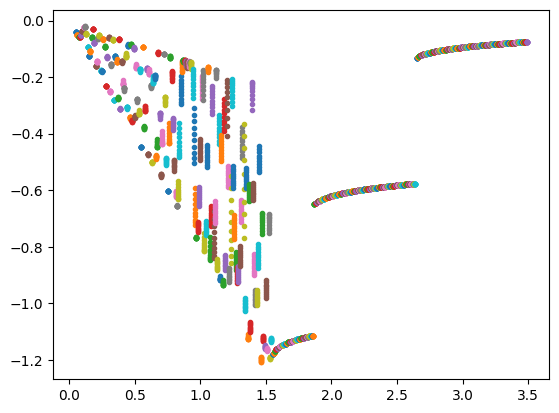

In [84]:
for K,F1,F2 in zip(Ks,S_F1s,S_F2s):
    F1_ =  (F1+np.pi)%(2*np.pi) - np.pi
    F2_ =  (F2+np.pi)%(2*np.pi) - np.pi
    # plt.plot(K*np.ones_like(F1_),F1_,'.')
    plt.plot(K*np.ones_like(F1_),F2_,'.')
    # plt.plot(K,F1[-1],'d')

In [160]:
sol.shape

(15001, 5000)

In [161]:
sol = (sol+np.pi)%(2*np.pi) - np.pi

In [162]:
sol.shape

(15001, 5000)

In [6]:
s = 150
theta = np.linspace(-np.pi,np.pi,s)
X,Y = np.meshgrid(theta,theta)
x,y = X.flatten(),Y.flatten()

In [7]:
N = s**2
PHI = np.zeros(2*N)
PHI[:N] = x
PHI[N:] = y

dt = 0.1
t_end = 1000
K = 2

t = np.arange(0, t_end+dt/2, dt)
Ks = np.arange(0,3.5,0.05)
S_F1s = []
S_F2s = []

sol = RK4(Kuramoto_Wmini,PHI,t, args=(N,3,K))
sol = (sol+np.pi)%(2*np.pi) - np.pi


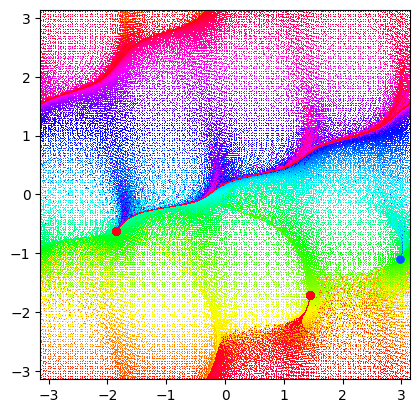

In [8]:
colors = plt.cm.hsv(np.linspace(0,1,N))
for i,color in zip(range(0,N,1),colors):
    plt.plot(sol[:,i],sol[:,N+i],',',color=color)
for i,color in zip(range(0,N,1),colors):
    plt.plot(sol[-1,i],sol[-1,N+i],'.',color=color,markersize=10)
    # plt.plot(sol[50,i],sol[50,N+i],'.',color=color,markersize=10)
plt.xlim(-np.pi,np.pi)
plt.ylim(-np.pi,np.pi)
plt.gca().set_aspect(1)

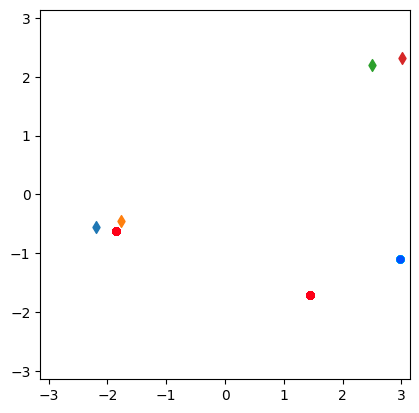

In [9]:
for i,color in zip(range(0,N,1),colors):
    plt.plot(sol[-1,i],sol[-1,N+i],'.',color=color,markersize=10)
    # plt.plot(sol[50,i],sol[50,N+i],'.',color=color,markersize=10)
plt.xlim(-np.pi,np.pi)
plt.ylim(-np.pi,np.pi)
plt.gca().set_aspect(1)

plt.scatter(-2.192,-0.548,marker='d')
plt.scatter(-1.774,-0.443,marker='d')
plt.scatter(2.502,2.196,marker='d')
plt.scatter(3.01,2.323,marker='d')

3.45

In [260]:
A = np.linspace(-np.pi,np.pi,1000)
X1,X2 = np.meshgrid(A,A)
K = 2
F1 = -3 + K*(np.sin(2*X2-X1)-np.sin(4*X1))
F2 = K*(-np.sin(X2)-np.sin(2*X2-X1))
F3 = 0*X1


/var/folders/lj/v2s5sd8n1cv2xdh0yw2kf0x00000gn/T/ipykernel_51834/3308391147.py:8: UserWarning: The following kwargs were not used by contour: 'color'
  ax.contour(X1,X2,F5,color='red')
/var/folders/lj/v2s5sd8n1cv2xdh0yw2kf0x00000gn/T/ipykernel_51834/3308391147.py:9: UserWarning: The following kwargs were not used by contour: 'color'
  ax.contour(X1,X2,F6,color='green')


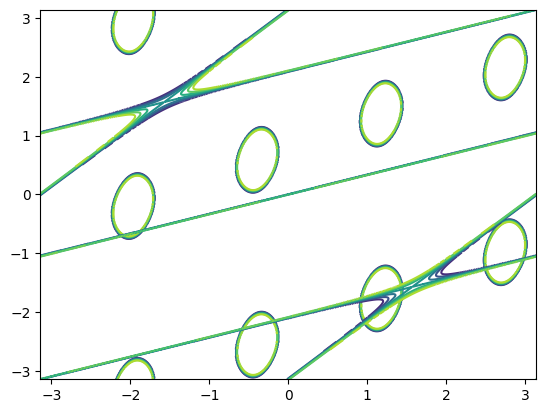

In [261]:
# F4 = np.where(abs((F1-F2))<0.3,F1-F2,np.nan)
F5 = np.where(abs((F1))<0.1,F1,np.nan)
F6 = np.where(abs((F2))<0.05,F2,np.nan)
fig = plt.figure()
ax = fig.add_subplot()

# ax.contour(X1,X2,F4,color='blue')
ax.contour(X1,X2,F5,color='red')
ax.contour(X1,X2,F6,color='green')

/var/folders/lj/v2s5sd8n1cv2xdh0yw2kf0x00000gn/T/ipykernel_51834/1932341017.py:13: UserWarning: The following kwargs were not used by contour: 'color'
  ax.contour(X1,X2,F4,color='blue')
/var/folders/lj/v2s5sd8n1cv2xdh0yw2kf0x00000gn/T/ipykernel_51834/1932341017.py:14: UserWarning: The following kwargs were not used by contour: 'color'
  ax.contour(X1,X2,F5,color='red')
/var/folders/lj/v2s5sd8n1cv2xdh0yw2kf0x00000gn/T/ipykernel_51834/1932341017.py:15: UserWarning: The following kwargs were not used by contour: 'color'
  ax.contour(X1,X2,F6,color='green')


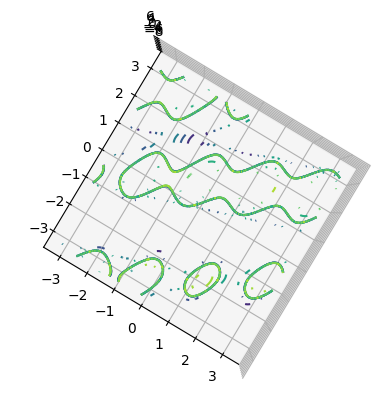

In [242]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# ax.scatter(X1,X2,F1)
F4 = np.where(abs((F1-F2))<0.1,F1-F2,np.nan)
F5 = np.where(abs((F1))<0.1,F1-F2,np.nan)
F6 = np.where(abs((F2))<0.1,F1-F2,np.nan)
# ax.scatter(X1,X2,F4,color='blue')
# ax.scatter(X1,X2,F5,color='red')
# ax.scatter(X1,X2,F6,color='green')


ax.contour(X1,X2,F4,color='blue')
ax.contour(X1,X2,F5,color='red')
ax.contour(X1,X2,F6,color='green')
ax.view_init(90)

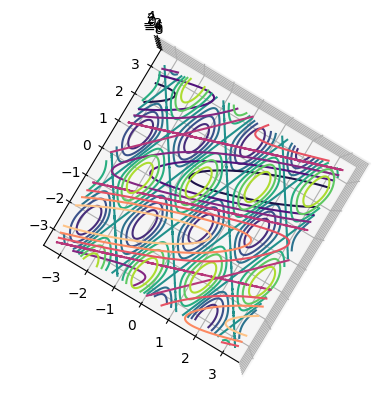

In [241]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# ax.scatter(X1,X2,F1)
# F4 = np.where(abs((F1-F2))<0.1,F1-F2,np.nan)
# F5 = np.where(abs((F1))<0.1,F1-F2,np.nan)
# F6 = np.where(abs((F2))<0.1,F1-F2,np.nan)
ax.contour(X1,X2,F1)
ax.contour(X1,X2,F2,cmap='magma')
ax.contour(X1,X2,F3)
ax.view_init(90)

/var/folders/lj/v2s5sd8n1cv2xdh0yw2kf0x00000gn/T/ipykernel_57699/2847403021.py:14: RuntimeWarning: invalid value encountered in sqrt
  return k + b*np.sqrt(1 - ((x - h)**2) / a**2)


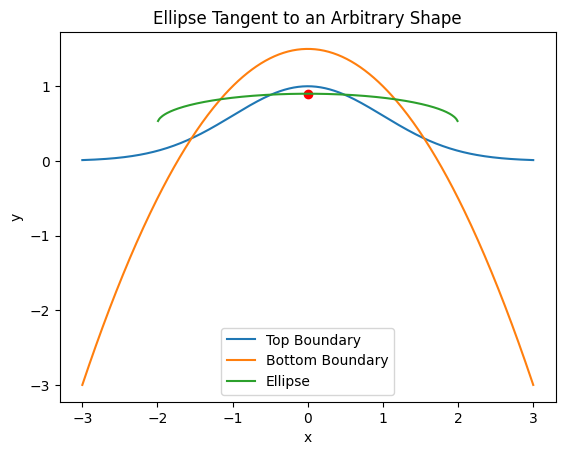

In [85]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# 도형의 상단 및 하단 경계 정의
def top_boundary(x):
    return np.exp(-(x**2)/2)

def bottom_boundary(x):
    return -0.5 * (x**2) + 1.5

# 타원의 방정식
def ellipse(x, h, k, a, b):
    return k + b*np.sqrt(1 - ((x - h)**2) / a**2)

# 타원과 도형의 접점을 찾는 함수
def find_tangent_point(h, k, a, b):
    def distance(x):
        top_dist = (ellipse(x, h, k, a, b) - top_boundary(x))**2
        bottom_dist = (ellipse(x, h, k, a, b) - bottom_boundary(x))**2
        return top_dist + bottom_dist

    res = minimize(distance, 0.0)
    return res.x

# 타원의 파라미터 설정
h = 0  # 타원의 중심 x 좌표
k = 0.5  # 타원의 중심 y 좌표
a = 2  # 타원의 장축 길이
b = 0.4  # 타원의 단축 길이

# 타원과 도형의 접점 찾기
x_tangent = find_tangent_point(h, k, a, b)

# 플롯 생성
x = np.linspace(-3, 3, 400)
plt.plot(x, top_boundary(x), label='Top Boundary')
plt.plot(x, bottom_boundary(x), label='Bottom Boundary')
plt.plot(x, ellipse(x, h, k, a, b), label='Ellipse')
plt.scatter([x_tangent], [ellipse(x_tangent, h, k, a, b)], color='red') # 접점 표시
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Ellipse Tangent to an Arbitrary Shape')
plt.show()
